# Machine Learning Engineer Nanodegree
## Reinforcement Learning
## Project: Train a Smartcab to Drive

Welcome to the fourth project of the Machine Learning Engineer Nanodegree! In this notebook, template code has already been provided for you to aid in your analysis of the *Smartcab* and your implemented learning algorithm. You will not need to modify the included code beyond what is requested. There will be questions that you must answer which relate to the project and the visualizations provided in the notebook. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide in `agent.py`.  

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

-----

## Getting Started
In this project, you will work towards constructing an optimized Q-Learning driving agent that will navigate a *Smartcab* through its environment towards a goal. Since the *Smartcab* is expected to drive passengers from one location to another, the driving agent will be evaluated on two very important metrics: **Safety** and **Reliability**. A driving agent that gets the *Smartcab* to its destination while running red lights or narrowly avoiding accidents would be considered **unsafe**. Similarly, a driving agent that frequently fails to reach the destination in time would be considered **unreliable**. Maximizing the driving agent's **safety** and **reliability** would ensure that *Smartcabs* have a permanent place in the transportation industry.

**Safety** and **Reliability** are measured using a letter-grade system as follows:

| Grade 	| Safety 	| Reliability 	|
|:-----:	|:------:	|:-----------:	|
|   A+  	|  Agent commits no traffic violations,<br/>and always chooses the correct action. | Agent reaches the destination in time<br />for 100% of trips. |
|   A   	|  Agent commits few minor traffic violations,<br/>such as failing to move on a green light. | Agent reaches the destination on time<br />for at least 90% of trips. |
|   B   	| Agent commits frequent minor traffic violations,<br/>such as failing to move on a green light. | Agent reaches the destination on time<br />for at least 80% of trips. |
|   C   	|  Agent commits at least one major traffic violation,<br/> such as driving through a red light. | Agent reaches the destination on time<br />for at least 70% of trips. |
|   D   	| Agent causes at least one minor accident,<br/> such as turning left on green with oncoming traffic.       	| Agent reaches the destination on time<br />for at least 60% of trips. |
|   F   	|  Agent causes at least one major accident,<br />such as driving through a red light with cross-traffic.      	| Agent fails to reach the destination on time<br />for at least 60% of trips. |

To assist evaluating these important metrics, you will need to load visualization code that will be used later on in the project. Run the code cell below to import this code which is required for your analysis.

In [1]:
# Import the visualization code
import visuals as vs

# Pretty display for notebooks
%matplotlib inline

### Understand the World
Before starting to work on implementing your driving agent, it's necessary to first understand the world (environment) which the *Smartcab* and driving agent work in. One of the major components to building a self-learning agent is understanding the characteristics about the agent, which includes how the agent operates. To begin, simply run the `agent.py` agent code exactly how it is -- no need to make any additions whatsoever. Let the resulting simulation run for some time to see the various working components. Note that in the visual simulation (if enabled), the **white vehicle** is the *Smartcab*.

### Question 1
In a few sentences, describe what you observe during the simulation when running the default `agent.py` agent code. Some things you could consider:
- *Does the Smartcab move at all during the simulation?*
- *What kind of rewards is the driving agent receiving?*
- *How does the light changing color affect the rewards?*  

**Hint:** From the `/smartcab/` top-level directory (where this notebook is located), run the command 
```bash
'python smartcab/agent.py'
```

In [2]:
!python smartcab/agent.py


/-------------------------
| Training trial 1
\-------------------------

Simulating trial. . . 
Agent not set to learn.

/-------------------
| Step 0 Results
\-------------------

!! Agent state not been updated!
Agent properly idled at a red light. (rewarded 1.82)
Agent not enforced to meet deadline.

/-------------------
| Step 1 Results
\-------------------

!! Agent state not been updated!
Agent properly idled at a red light. (rewarded 1.17)
Agent not enforced to meet deadline.

/-------------------
| Step 2 Results
\-------------------

!! Agent state not been updated!
Agent properly idled at a red light. (rewarded 2.30)
Agent not enforced to meet deadline.

/-------------------
| Step 3 Results
\-------------------

!! Agent state not been updated!
Agent properly idled at a red light. (rewarded 2.01)
Agent not enforced to meet deadline.

/-------------------
| Step 4 Results
\-------------------

!! Agent state not been updated!
Agent properly idled at a red light. (rewarded 1

**Answer:**   
The Smartcab does not move at all during the simulation. The agent was reciving positive or negative values as rewards for positive or negative behaviour respectively. The driving agent was receiving negative value as reward for idling at a green light when there was no oncoming traffic. It was receiving positive reward between 0 and 1 for idling at a green light when there was oncoming traffic. It was receiving positive reward greater than 1 for idling at a red light.    
The agent is not forced to meet a deadline and it was not programmed to take any actions.

### Understand the Code
In addition to understanding the world, it is also necessary to understand the code itself that governs how the world, simulation, and so on operate. Attempting to create a driving agent would be difficult without having at least explored the *"hidden"* devices that make everything work. In the `/smartcab/` top-level directory, there are two folders: `/logs/` (which will be used later) and `/smartcab/`. Open the `/smartcab/` folder and explore each Python file included, then answer the following question.

### Question 2
- *In the *`agent.py`* Python file, choose three flags that can be set and explain how they change the simulation.*
- *In the *`environment.py`* Python file, what Environment class function is called when an agent performs an action?*
- *In the *`simulator.py`* Python file, what is the difference between the *`'render_text()'`* function and the *`'render()'`* function?*
- *In the *`planner.py`* Python file, will the *`'next_waypoint()`* function consider the North-South or East-West direction first?*

**Answer:**   
1) alpha, the learning rate. If set to 0, no learning will take place. If set to 1, the agent will only learn and consider the most recent information. Since the environment is always changing we would like an alpha that starts strong and decays.     
2) epsilon, the exploration rate. If set to less than 1, algorithm would choose uniformly from the set of actions other than the best action with probability 1-epsilon.    
3) enforce_deadline, a flag to enforce the agent to reach the destination. If not set to true, the agent need not reach the destination as in our initial simulation above.    
    
The function "act" is called when the agent performs an action.    

render_text() displays information about the past trial in the command prompt or in the ipython notebook as above while render() displays the information of the current simulation in the GUI.    

The function considers East-West direction first. 

-----
## Implement a Basic Driving Agent

The first step to creating an optimized Q-Learning driving agent is getting the agent to actually take valid actions. In this case, a valid action is one of `None`, (do nothing) `'Left'` (turn left), `'Right'` (turn right), or `'Forward'` (go forward). For your first implementation, navigate to the `'choose_action()'` agent function and make the driving agent randomly choose one of these actions. Note that you have access to several class variables that will help you write this functionality, such as `'self.learning'` and `'self.valid_actions'`. Once implemented, run the agent file and simulation briefly to confirm that your driving agent is taking a random action each time step.

In [2]:
!python smartcab/agent.py


/-------------------------
| Training trial 1
\-------------------------

Simulating trial. . . 
Agent not set to learn.

/-------------------
| Step 0 Results
\-------------------

!! Agent state not been updated!
Agent attempted driving left through a red light with traffic and cause a major accident. (rewarded -40.18)
Agent not enforced to meet deadline.

/-------------------
| Step 1 Results
\-------------------

!! Agent state not been updated!
Agent properly idled at a red light. (rewarded 1.85)
Agent not enforced to meet deadline.

/-------------------
| Step 2 Results
\-------------------

!! Agent state not been updated!
Agent attempted driving forward through a red light. (rewarded -10.36)
Agent not enforced to meet deadline.

/-------------------
| Step 3 Results
\-------------------

!! Agent state not been updated!
Agent followed the waypoint right. (rewarded 1.86)
Agent not enforced to meet deadline.

/-------------------
| Step 4 Results
\-------------------

!! Agent s

### Basic Agent Simulation Results
To obtain results from the initial simulation, you will need to adjust following flags:
- `'enforce_deadline'` - Set this to `True` to force the driving agent to capture whether it reaches the destination in time.
- `'update_delay'` - Set this to a small value (such as `0.01`) to reduce the time between steps in each trial.
- `'log_metrics'` - Set this to `True` to log the simluation results as a `.csv` file in `/logs/`.
- `'n_test'` - Set this to `'10'` to perform 10 testing trials.

Optionally, you may disable to the visual simulation (which can make the trials go faster) by setting the `'display'` flag to `False`. Flags that have been set here should be returned to their default setting when debugging. It is important that you understand what each flag does and how it affects the simulation!

Once you have successfully completed the initial simulation (there should have been 20 training trials and 10 testing trials), run the code cell below to visualize the results. Note that log files are overwritten when identical simulations are run, so be careful with what log file is being loaded!
Run the agent.py file after setting the flags from projects/smartcab folder instead of projects/smartcab/smartcab.


In [2]:
!python smartcab/agent.py


/-------------------------
| Training trial 1
\-------------------------

Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not set to learn.
Simulating trial. . . 
Agent not

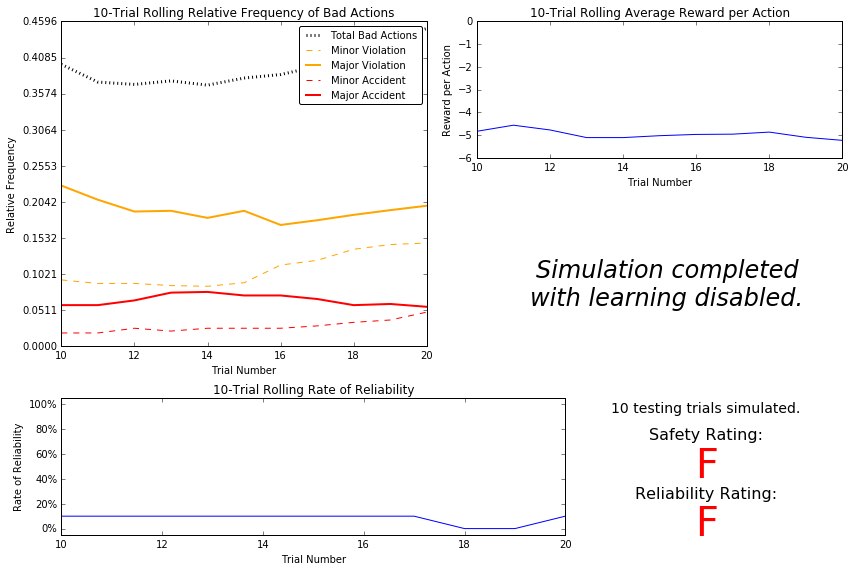

In [3]:
# Load the 'sim_no-learning' log file from the initial simulation results
vs.plot_trials('sim_no-learning.csv')

### Question 3
Using the visualization above that was produced from your initial simulation, provide an analysis and make several observations about the driving agent. Be sure that you are making at least one observation about each panel present in the visualization. Some things you could consider:
- *How frequently is the driving agent making bad decisions? How many of those bad decisions cause accidents?*
- *Given that the agent is driving randomly, does the rate of reliabilty make sense?*
- *What kind of rewards is the agent receiving for its actions? Do the rewards suggest it has been penalized heavily?*
- *As the number of trials increases, does the outcome of results change significantly?*
- *Would this Smartcab be considered safe and/or reliable for its passengers? Why or why not?*

**Answer:**    
The agent is making bad actions about 35% to 40% of the time in each trial. About 5% to 7% of the time, this leads to major accidents.    
More often than not, the smart cab won't reach its destination since it is simply driving around randomly. The poor rate of reliability here is due to the agent simply exploring but not learning. So it makes sense to have the rate of reliability here from this point of view. We can deduce that randomly driving around is not a reliable method of reaching one's destination.         
The agent is receiving a value. In our simulation above, it is receiving negative rewards on average. It is receiving around -5 per action on average which suggests heavy penalty but we have not enabled learning yet.     
Since we have not enabled the agent to learn, the outcome should not change in this case. The rate of reliability also remains constant at around 10%.    
This smarcab would definitely not be considered safe or reliable becuase of the high rate of accidents both major and minor and it does not reach the destination as well most of the time.   

-----
## Inform the Driving Agent
The second step to creating an optimized Q-learning driving agent is defining a set of states that the agent can occupy in the environment. Depending on the input, sensory data, and additional variables available to the driving agent, a set of states can be defined for the agent so that it can eventually *learn* what action it should take when occupying a state. The condition of `'if state then action'` for each state is called a **policy**, and is ultimately what the driving agent is expected to learn. Without defining states, the driving agent would never understand which action is most optimal -- or even what environmental variables and conditions it cares about!

### Identify States
Inspecting the `'build_state()'` agent function shows that the driving agent is given the following data from the environment:
- `'waypoint'`, which is the direction the *Smartcab* should drive leading to the destination, relative to the *Smartcab*'s heading.
- `'inputs'`, which is the sensor data from the *Smartcab*. It includes 
  - `'light'`, the color of the light.
  - `'left'`, the intended direction of travel for a vehicle to the *Smartcab*'s left. Returns `None` if no vehicle is present.
  - `'right'`, the intended direction of travel for a vehicle to the *Smartcab*'s right. Returns `None` if no vehicle is present.
  - `'oncoming'`, the intended direction of travel for a vehicle across the intersection from the *Smartcab*. Returns `None` if no vehicle is present.
- `'deadline'`, which is the number of actions remaining for the *Smartcab* to reach the destination before running out of time.

### Question 4
*Which features available to the agent are most relevant for learning both **safety** and **efficiency**? Why are these features appropriate for modeling the *Smartcab* in the environment? If you did not choose some features, why are those features* not *appropriate?*

**Answer:**      
Waypoint is a feature relevant for efficiency. It allows the agent to plan its route based on location and heading. Without it we will not be able to direct the agent to our destination. Hence, this is important.       
Inputs is feature that is relevant for safety. Without it the agent would not be able to avoid other agents on the road. Hence, this is an important feature.    
Deadline thought relevant to improve efficency, it isn't the most relevant for safety as it could possibly invoke a bad action from an agent such as moving during a red light.    


### Define a State Space
When defining a set of states that the agent can occupy, it is necessary to consider the *size* of the state space. That is to say, if you expect the driving agent to learn a **policy** for each state, you would need to have an optimal action for *every* state the agent can occupy. If the number of all possible states is very large, it might be the case that the driving agent never learns what to do in some states, which can lead to uninformed decisions. For example, consider a case where the following features are used to define the state of the *Smartcab*:

`('is_raining', 'is_foggy', 'is_red_light', 'turn_left', 'no_traffic', 'previous_turn_left', 'time_of_day')`.

How frequently would the agent occupy a state like `(False, True, True, True, False, False, '3AM')`? Without a near-infinite amount of time for training, it's doubtful the agent would ever learn the proper action!

### Question 5
*If a state is defined using the features you've selected from **Question 4**, what would be the size of the state space? Given what you know about the evironment and how it is simulated, do you think the driving agent could learn a policy for each possible state within a reasonable number of training trials?*  
**Hint:** Consider the *combinations* of features to calculate the total number of states!

**Answer:**     
Waypoint has 3 features of "forward, "left" and "right". Inputs have 4 features of "light", "left", "right", "oncoming". Of which, light has 2 features and left, right and oncoming have 4 features. So the total number of states is 3 x 2 x 4 x 4 x 4 = 384 features. The driving agent could not learn a policy for each possible state within a reasonable number of training trials.   
We could implement with Waypoint and 3 of the 4 features of Inputs, namely, light, oncoming and left. This would take the total number of states to 3 x 2 x 4 x 4=96 which is feasible for the driving agent to learn a policy within a reasonable number of training trials. Also, it captures the most relevant features of not running a red light and to look out for oncoming vehicles. While, it is green light, our agent would have the right of way. At a red light it is possible for the agent to turn right given the there is no oncoming from the left. These set of state space would consider whether the oncoming vehicle would be turning into its path or into the agent.    
We can see how many trials would be needed to for the agent to learn the outcomes of these 96 state spaces by running a monte carlo simulation.

In [2]:
from sets import Set
from random import choice

def chance_of_visiting_all_states(iterations, k, n=24):
    r = range(n)
    total = 0
    for i in range(iterations):
        s = Set()
        for j in range(k):
            s.add(choice(r))
            if len(s) == n:
                total +=1
                break
    return float(total)/iterations

steps = 750
print "Chance of visiting all states in {st} \
steps: {ch}".format(st = steps, ch = chance_of_visiting_all_states(2000, steps, 96))

C:\Users\User\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: the sets module is deprecated
  if __name__ == '__main__':


Chance of visiting all states in 750 steps: 0.9575


In [4]:
steps2 = 1200
print "Chance of visiting all states in {st} \
steps: {ch}".format(st = steps2 , ch = chance_of_visiting_all_states(4000, steps2, 96))

Chance of visiting all states in 1200 steps: 0.99925


### Update the Driving Agent State
For your second implementation, navigate to the `'build_state()'` agent function. With the justification you've provided in **Question 4**, you will now set the `'state'` variable to a tuple of all the features necessary for Q-Learning. Confirm your driving agent is updating its state by running the agent file and simulation briefly and note whether the state is displaying. If the visual simulation is used, confirm that the updated state corresponds with what is seen in the simulation.

**Note:** Remember to reset simulation flags to their default setting when making this observation!

In [4]:
!python smartcab/agent.py


/-------------------------
| Training trial 1
\-------------------------

Simulating trial. . . 
Agent not set to learn.

/-------------------
| Step 0 Results
\-------------------

Agent previous state: ('right', {'light': 'red', 'oncoming': 'left', 'right': None, 'left': None})
Agent attempted driving left through a red light. (rewarded -10.17)
Agent not enforced to meet deadline.

/-------------------
| Step 1 Results
\-------------------

Agent previous state: ('right', {'light': 'red', 'oncoming': 'left', 'right': 'left', 'left': None})
Agent attempted driving left through a red light. (rewarded -10.00)
Agent not enforced to meet deadline.

/-------------------
| Step 2 Results
\-------------------

Agent previous state: ('right', {'light': 'red', 'oncoming': 'left', 'right': None, 'left': 'left'})
Agent properly idled at a red light. (rewarded 2.19)
Agent not enforced to meet deadline.

/-------------------
| Step 3 Results
\-------------------

Agent previous state: ('right', {

-----
## Implement a Q-Learning Driving Agent
The third step to creating an optimized Q-Learning agent is to begin implementing the functionality of Q-Learning itself. The concept of Q-Learning is fairly straightforward: For every state the agent visits, create an entry in the Q-table for all state-action pairs available. Then, when the agent encounters a state and performs an action, update the Q-value associated with that state-action pair based on the reward received and the interative update rule implemented. Of course, additional benefits come from Q-Learning, such that we can have the agent choose the *best* action for each state based on the Q-values of each state-action pair possible. For this project, you will be implementing a *decaying,* $\epsilon$*-greedy* Q-learning algorithm with *no* discount factor. Follow the implementation instructions under each **TODO** in the agent functions.

Note that the agent attribute `self.Q` is a dictionary: This is how the Q-table will be formed. Each state will be a key of the `self.Q` dictionary, and each value will then be another dictionary that holds the *action* and *Q-value*. Here is an example:

```
{ 'state-1': { 
    'action-1' : Qvalue-1,
    'action-2' : Qvalue-2,
     ...
   },
  'state-2': {
    'action-1' : Qvalue-1,
     ...
   },
   ...
}
```

Furthermore, note that you are expected to use a *decaying* $\epsilon$ *(exploration) factor*. Hence, as the number of trials increases, $\epsilon$ should decrease towards 0. This is because the agent is expected to learn from its behavior and begin acting on its learned behavior. Additionally, The agent will be tested on what it has learned after $\epsilon$ has passed a certain threshold (the default threshold is 0.01). For the initial Q-Learning implementation, you will be implementing a linear decaying function for $\epsilon$.

In [17]:
!python smartcab/agent.py


/-------------------------
| Training trial 1
\-------------------------

Simulating trial. . . 
Agent not set to learn.

/-------------------
| Step 0 Results
\-------------------

('right', 'green', 'left', 'left', 'left')
Agent previous state: ('right', 'green', 'left', 'left', 'left')
Agent drove forward instead of right. (rewarded 1.17)
Agent not enforced to meet deadline.

/-------------------
| Step 1 Results
\-------------------

('right', 'red', 'forward', None, None)
Agent previous state: ('right', 'red', 'forward', None, None)
Agent attempted driving left through a red light. (rewarded -10.46)
Agent not enforced to meet deadline.

/-------------------
| Step 2 Results
\-------------------

('right', 'red', 'forward', None, None)
Agent previous state: ('right', 'red', 'forward', None, None)
Agent followed the waypoint right. (rewarded 1.95)
Agent not enforced to meet deadline.

/-------------------
| Step 3 Results
\-------------------

('forward', 'red', None, 'right', None

### Q-Learning Simulation Results
To obtain results from the initial Q-Learning implementation, you will need to adjust the following flags and setup:
- `'enforce_deadline'` - Set this to `True` to force the driving agent to capture whether it reaches the destination in time.
- `'update_delay'` - Set this to a small value (such as `0.01`) to reduce the time between steps in each trial.
- `'log_metrics'` - Set this to `True` to log the simluation results as a `.csv` file and the Q-table as a `.txt` file in `/logs/`.
- `'n_test'` - Set this to `'10'` to perform 10 testing trials.
- `'learning'` - Set this to `'True'` to tell the driving agent to use your Q-Learning implementation.

In addition, use the following decay function for $\epsilon$:

$$ \epsilon_{t+1} = \epsilon_{t} - 0.05, \hspace{10px}\textrm{for trial number } t$$

If you have difficulty getting your implementation to work, try setting the `'verbose'` flag to `True` to help debug. Flags that have been set here should be returned to their default setting when debugging. It is important that you understand what each flag does and how it affects the simulation! 

Once you have successfully completed the initial Q-Learning simulation, run the code cell below to visualize the results. Note that log files are overwritten when identical simulations are run, so be careful with what log file is being loaded!

In [19]:
!python smartcab/agent.py


/-------------------------
| Training trial 1
\-------------------------

Environment.reset(): Trial set up with start = (6, 4), destination = (2, 3), deadline = 25
0.95
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9500; alph

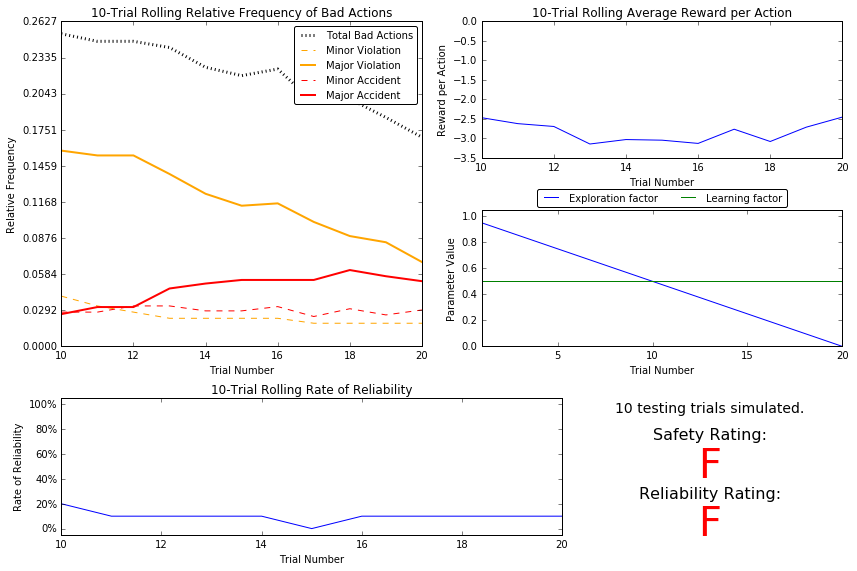

In [20]:
# Load the 'sim_default-learning' file from the default Q-Learning simulation
vs.plot_trials('sim_default-learning.csv')

### Question 6
Using the visualization above that was produced from your default Q-Learning simulation, provide an analysis and make observations about the driving agent like in **Question 3**. Note that the simulation should have also produced the Q-table in a text file which can help you make observations about the agent's learning. Some additional things you could consider:  
- *Are there any observations that are similar between the basic driving agent and the default Q-Learning agent?*
- *Approximately how many training trials did the driving agent require before testing? Does that number make sense given the epsilon-tolerance?*
- *Is the decaying function you implemented for $\epsilon$ (the exploration factor) accurately represented in the parameters panel?*
- *As the number of training trials increased, did the number of bad actions decrease? Did the average reward increase?*
- *How does the safety and reliability rating compare to the initial driving agent?*

**Answer:**    
They are still getting into major accidents and taking bad actions. Both of their safety and reliability ratings are still F.    
Epsilon decays by 0.05 each time. Since it starts from 1, there are 20 training trials. Yes, the decaying function is a linear function and it is accurately represented in the parameters.     
Yes, as the number of training trials increased, the number of bad actions decreased. This can be seen by the black dotted lines in the first panel of the visualisation. The average reward compared to the initial driving agent is higher with all of them being above -3.5. Also as the number of trials increases it seems that the average reward is also increasing, though we would need more trials to verify this.     
The safety and reliability ratings are still F because of major accidents and bad decisisons.

-----
## Improve the Q-Learning Driving Agent
The third step to creating an optimized Q-Learning agent is to perform the optimization! Now that the Q-Learning algorithm is implemented and the driving agent is successfully learning, it's necessary to tune settings and adjust learning paramaters so the driving agent learns both **safety** and **efficiency**. Typically this step will require a lot of trial and error, as some settings will invariably make the learning worse. One thing to keep in mind is the act of learning itself and the time that this takes: In theory, we could allow the agent to learn for an incredibly long amount of time; however, another goal of Q-Learning is to *transition from experimenting with unlearned behavior to acting on learned behavior*. For example, always allowing the agent to perform a random action during training (if $\epsilon = 1$ and never decays) will certainly make it *learn*, but never let it *act*. When improving on your Q-Learning implementation, consider the impliciations it creates and whether it is logistically sensible to make a particular adjustment.

### Improved Q-Learning Simulation Results
To obtain results from the initial Q-Learning implementation, you will need to adjust the following flags and setup:
- `'enforce_deadline'` - Set this to `True` to force the driving agent to capture whether it reaches the destination in time.
- `'update_delay'` - Set this to a small value (such as `0.01`) to reduce the time between steps in each trial.
- `'log_metrics'` - Set this to `True` to log the simluation results as a `.csv` file and the Q-table as a `.txt` file in `/logs/`.
- `'learning'` - Set this to `'True'` to tell the driving agent to use your Q-Learning implementation.
- `'optimized'` - Set this to `'True'` to tell the driving agent you are performing an optimized version of the Q-Learning implementation.

Additional flags that can be adjusted as part of optimizing the Q-Learning agent:
- `'n_test'` - Set this to some positive number (previously 10) to perform that many testing trials.
- `'alpha'` - Set this to a real number between 0 - 1 to adjust the learning rate of the Q-Learning algorithm.
- `'epsilon'` - Set this to a real number between 0 - 1 to adjust the starting exploration factor of the Q-Learning algorithm.
- `'tolerance'` - set this to some small value larger than 0 (default was 0.05) to set the epsilon threshold for testing.

Furthermore, use a decaying function of your choice for $\epsilon$ (the exploration factor). Note that whichever function you use, it **must decay to **`'tolerance'`** at a reasonable rate**. The Q-Learning agent will not begin testing until this occurs. Some example decaying functions (for $t$, the number of trials):

$$ \epsilon = a^t, \textrm{for } 0 < a < 1 \hspace{50px}\epsilon = \frac{1}{t^2}\hspace{50px}\epsilon = e^{-at}, \textrm{for } 0 < a < 1 \hspace{50px} \epsilon = \cos(at), \textrm{for } 0 < a < 1$$
You may also use a decaying function for $\alpha$ (the learning rate) if you so choose, however this is typically less common. If you do so, be sure that it adheres to the inequality $0 \leq \alpha \leq 1$.

If you have difficulty getting your implementation to work, try setting the `'verbose'` flag to `True` to help debug. Flags that have been set here should be returned to their default setting when debugging. It is important that you understand what each flag does and how it affects the simulation! 

Once you have successfully completed the improved Q-Learning simulation, run the code cell below to visualize the results. Note that log files are overwritten when identical simulations are run, so be careful with what log file is being loaded!

In [5]:
!python smartcab/agent.py


/-------------------------
| Training trial 1
\-------------------------

Environment.reset(): Trial set up with start = (2, 2), destination = (5, 6), deadline = 25
0.996207210863
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.9962; alpha = 0.5000
Simulating trial. . . 
epsilon = 0.

ValueError: I/O operation on closed file

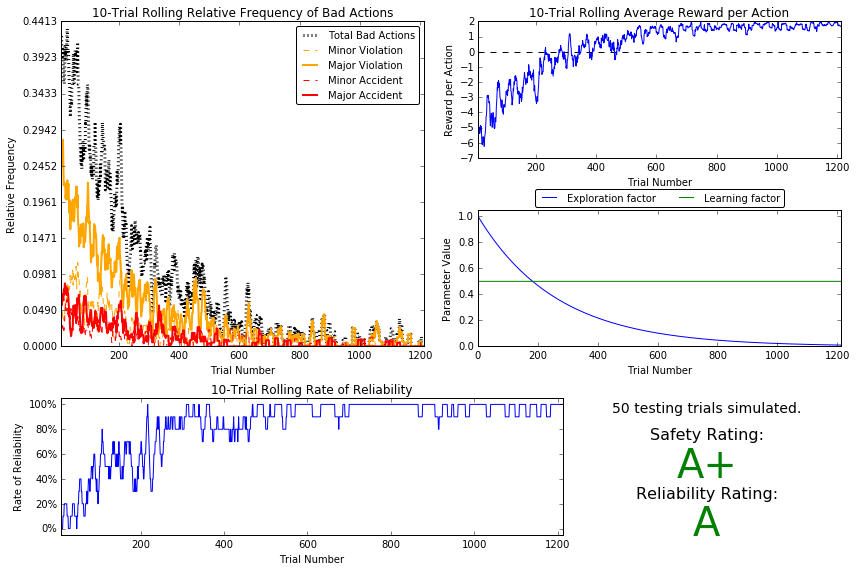

In [6]:
# Load the 'sim_improved-learning' file from the improved Q-Learning simulation
vs.plot_trials('sim_improved-learning.csv')

### Question 7
Using the visualization above that was produced from your improved Q-Learning simulation, provide a final analysis and make observations about the improved driving agent like in **Question 6**. Questions you should answer:  
- *What decaying function was used for epsilon (the exploration factor)?*
- *Approximately how many training trials were needed for your agent before begining testing?*
- *What epsilon-tolerance and alpha (learning rate) did you use? Why did you use them?*
- *How much improvement was made with this Q-Learner when compared to the default Q-Learner from the previous section?*
- *Would you say that the Q-Learner results show that your driving agent successfully learned an appropriate policy?*
- *Are you satisfied with the safety and reliability ratings of the *Smartcab*?*

**Answer:**    
We implemented this model with a state space of Waypoint, Inputs['Light'], Inputs['Oncoming'] and Inputs['left']. We had 96 state space. The full 384 feature state space was not feasible to learn from and our agent kept getting into an accident. To have 384 feature state space and perform as good, we would need a lot more trials.     
Epsilon was decayed with exp(-0.0038 x t). We wanted to take about 1200 trials with tolerance 0.01. So solving exp(-a(1200)) = 0.01, we got a value of 0.0038 for the constant. We took about 1200 training trials before testing as we had intended to. Epsilon-tolerance was 0.01 and alpha was 0.5. An alpha of 0.5 gives equal weightage to the update the Q values with reward and current value. A tolerance of 0.01 was sufficient to attain the desired rating. 

This Q learner has improved significantly from the previous one with 20 trials. Comparing to the previous panel of total bad actions and accidents, we can see that the number of bad actions and accidents drop significantly as the trials increase. The rate of reliability was consistently poor in our previous one while here, though there were some drops to 80% or 90%, most of the times it was at the 100% mark after 600 trials. Also, the average reward per action increased drastically and stayed in the positive region. In the previous Q learning, the average reward was still hovering up and down and it was still negative. Also in this algorithm we had used an exponentially decaying exploration factor while previously we had used a linear one. Also, we had a lot more trials for our agent to learn. This Q learning algorithm has attained a score of A+ for safety which is very vital. It has gotten A for reliability which is far better than our previous one.       

Yes, it has learnt an appropriate policy for the features mentioned. However, in the real world, we would need to consider more factors such as pedestrians. I am satisfied with the safety and reliability ratings.

### Define an Optimal Policy

Sometimes, the answer to the important question *"what am I trying to get my agent to learn?"* only has a theoretical answer and cannot be concretely described. Here, however, you can concretely define what it is the agent is trying to learn, and that is the U.S. right-of-way traffic laws. Since these laws are known information, you can further define, for each state the *Smartcab* is occupying, the optimal action for the driving agent based on these laws. In that case, we call the set of optimal state-action pairs an **optimal policy**. Hence, unlike some theoretical answers, it is clear whether the agent is acting "incorrectly" not only by the reward (penalty) it receives, but also by pure observation. If the agent drives through a red light, we both see it receive a negative reward but also know that it is not the correct behavior. This can be used to your advantage for verifying whether the **policy** your driving agent has learned is the correct one, or if it is a **suboptimal policy**.

### Question 8
Provide a few examples (using the states you've defined) of what an optimal policy for this problem would look like. Afterwards, investigate the `'sim_improved-learning.txt'` text file to see the results of your improved Q-Learning algorithm. _For each state that has been recorded from the simulation, is the **policy** (the action with the highest value) correct for the given state? Are there any states where the policy is different than what would be expected from an optimal policy?_ Provide an example of a state and all state-action rewards recorded, and explain why it is the correct policy.

**Answer:**     
For our state space of (waypoint, inputs['light'], inputs['oncoming'], inputs['left']), we expect the following actions,               
1. (right, red , inputs['oncoming'], forward) -> none, regardless of other values for 'oncoming'.
2. (forward/left, red, inputs['oncoming'], inputs['left']) -> none, regardless of other values
3. (right, red , inputs['oncoming'], left/right/none) -> right
4. (forward, green, inputs['oncoming'], inputs['left']) -> forward,  
5. (right, green, inputs['oncoming'], inputs['left']) -> right,  
6. (left, green, forward/right/left, inputs['left']) -> none, oncoming vehicles have right of way.     
7. (left, green, none, inputs['left']) -> left.    
   
There are a few incorrect policies. Namely,   
('left', 'green', 'forward', 'left')   It is safe but should have been none.   
 -- forward : 0.73
 -- right : 0.13
 -- None : -4.10
 -- left : -18.77    

('left', 'green', 'right', 'right')    It is safe but should have been none    
 -- forward : 0.39
 -- right : 0.00
 -- None : -2.13
 -- left : -10.14    

('left', 'green', 'right', 'left')  It is safe but should have been none    
 -- forward : 0.66
 -- right : 0.26
 -- None : -4.22
 -- left : -15.46     

('left', 'green', 'forward', 'right') It is safe but should have been none   
 -- forward : 0.69
 -- right : 0.37
 -- None : -4.90
 -- left : -15.45    
 
('left', 'green', 'forward', None)  It is safe but should have been none     
 -- forward : 0.12
 -- right : 1.20
 -- None : -4.67
 -- left : -19.76    
 
('left', 'green', 'right', 'forward')  It is safe but should have been none    
 -- forward : 0.00
 -- right : 0.92
 -- None : -3.83
 -- left : 0.00    
 
('right', 'red', None, None) We can go right but it is safe at none.    
 -- forward : -24.90
 -- right : 1.66
 -- None : 1.78
 -- left : -14.01    
 
('right', 'red', 'left', None) Also not bad in the interest of safety but it can go right    
 -- forward : -9.81
 -- right : 0.92
 -- None : 1.49
 -- left : -28.90    
 
('left', 'green', 'right', None) It is safe but should have been none    
 -- forward : 0.28
 -- right : 0.90
 -- None : -4.74
 -- left : -19.79    
 
('right', 'red', 'forward', 'right')  It is safe but should have been going right    
 -- forward : -8.64
 -- right : 0.00
 -- None : 1.95
 -- left : -7.67    
 
('right', 'red', 'right', 'right')  It is safe but should have been going right     
 -- forward : -7.96
 -- right : 0.76
 -- None : 2.05
 -- left : -34.54     


All of the decisions are good in terms of safety. Many a times, the agent turns away from its destination. Hence, the lower reliability rating. This suggests that the policy is not the most efficient but it does not cause any major accidents. In that sense, it is optimal but it does mean that our agent would take a longer route to reach its destination.

-----
### Optional: Future Rewards - Discount Factor, `'gamma'`
Curiously, as part of the Q-Learning algorithm, you were asked to **not** use the discount factor, `'gamma'` in the implementation. Including future rewards in the algorithm is used to aid in propogating positive rewards backwards from a future state to the current state. Essentially, if the driving agent is given the option to make several actions to arrive at different states, including future rewards will bias the agent towards states that could provide even more rewards. An example of this would be the driving agent moving towards a goal: With all actions and rewards equal, moving towards the goal would theoretically yield better rewards if there is an additional reward for reaching the goal. However, even though in this project, the driving agent is trying to reach a destination in the allotted time, including future rewards will not benefit the agent. In fact, if the agent were given many trials to learn, it could negatively affect Q-values!

### Optional Question 9
*There are two characteristics about the project that invalidate the use of future rewards in the Q-Learning algorithm. One characteristic has to do with the *Smartcab* itself, and the other has to do with the environment. Can you figure out what they are and why future rewards won't work for this project?*

**Answer:**    
The environment is non-deterministic in the sense that the future states of the traffic lights cannot be determined to get an estimate of optimal future value. Meaning to say that you won't know which state you will end up in the future given our state space. Furthermore, the destination and starting location changes with every trial. Thus a future value for a state will not be the same for each different trial. This would only mess up our learner.         
The smartcab only gets information from the current intersection and not from future states. Hence, it is not possible to assign a value for Q(S_t,a_t) for future time periods. It does not have a global view of the environment like the distance to destination. It only loses time at each intersection.    
So if we put future rewards into this, they will be incorrect and possibly random for the reasons mentioned above and it would not benefit the model.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  
**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.